# Which color wines have highest quality ?

Analyze wine_quality dataset using pyspark and pysql on Azure DataBricks

## Load the data

In [0]:
       
df1 = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/samyumobi@gmail.com/Wine_Quality_Data.csv")
display(df1.limit(10))

fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
7.4,0.7,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
7.8,0.88,0.0,2.6,0.098,25.0,67.0,0.9968,3.2,0.68,9.8,5,red
7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.997,3.26,0.65,9.8,5,red
11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.998,3.16,0.58,9.8,6,red
7.4,0.7,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
7.4,0.66,0.0,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5,red
7.9,0.6,0.06,1.6,0.069,15.0,59.0,0.9964,3.3,0.46,9.4,5,red
7.3,0.65,0.0,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7,red
7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7,red
7.5,0.5,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.8,10.5,5,red


In [0]:
%scala
val df = spark.read.format("csv").option("header","true").load("dbfs:/FileStore/shared_uploads/samyumobi@gmail.com/Wine_Quality_Data.csv")

display(df.limit(10))

fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
7.4,0.7,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
7.8,0.88,0.0,2.6,0.098,25.0,67.0,0.9968,3.2,0.68,9.8,5,red
7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.997,3.26,0.65,9.8,5,red
11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.998,3.16,0.58,9.8,6,red
7.4,0.7,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
7.4,0.66,0.0,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5,red
7.9,0.6,0.06,1.6,0.069,15.0,59.0,0.9964,3.3,0.46,9.4,5,red
7.3,0.65,0.0,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7,red
7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7,red
7.5,0.5,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.8,10.5,5,red


#Specify schema for the dataframe

In [0]:

from pyspark.sql.types import *
from pyspark.sql.functions import *

productSchema = StructType([
    StructField("fixed_acidity",FloatType()),
    StructField("volatile_acidity",FloatType()),
    StructField("citric_acid",FloatType()),
    StructField("alcohol",StringType()),
    StructField("quality",FloatType()),
    StructField("color",StringType())
])

ps = spark.read.load('dbfs:/FileStore/shared_uploads/samyumobi@gmail.com/Wine_Quality_Data.csv',format = 'csv',schema = productSchema,header = False)
display(ps.limit(5))



fixed_acidity,volatile_acidity,citric_acid,alcohol,quality,color
null,null,null,residual_sugar,null,free_sulfur_dioxide
7.4,0.7,0.0,1.9,0.076,11.0
7.8,0.88,0.0,2.6,0.098,25.0
7.8,0.76,0.04,2.3,0.092,15.0
11.2,0.28,0.56,1.9,0.075,17.0


In [0]:
% md 

# Filter and group dataframes



In [0]:

acids_df = ps.select("fixed_acidity","volatile_acidity")

display(acids_df.limit(10))

fixed_acidity,volatile_acidity
null,null
7.4,0.7
7.8,0.88
7.8,0.76
11.2,0.28
7.4,0.7
7.4,0.66
7.9,0.6
7.3,0.65
7.8,0.58


In [0]:
# It can also be done using subset selection
df_acid = df1["fixed_acidity", "volatile_acidity"]

display(df_acid.limit(10))

fixed_acidity,volatile_acidity
7.4,0.7
7.8,0.88
7.8,0.76
11.2,0.28
7.4,0.7
7.4,0.66
7.9,0.6
7.3,0.65
7.8,0.58
7.5,0.5


In [0]:
# Transform data by chaining methods

chemicals_df = df1.select("color","alcohol").where((df1["color"] == "red") | (df1["color"] == "free_sulfur_dioxide"))

display(chemicals_df.limit(10))

color,alcohol
red,9.4
red,9.8
red,9.8
red,9.8
red,9.4
red,9.4
red,9.4
red,10.0
red,9.5
red,10.5


In [0]:
# group By and aggregate functions

# Count number of colors for each alcohol

alcohol_color_count = df1.select("color","alcohol").groupBy("color").count()
display(alcohol_color_count)

color,count
white,4898
red,1599


# Spark SQL

In [0]:
# Creating Temporary view (DB Object in Spark)

df1.createOrReplaceTempView("Wines")

In [0]:
# Spark SQL querying

wines_df = spark.sql("select alcohol, color from  Wines where color IN ('white','red')")
display(wines_df)


alcohol,color
9.4,red
9.8,red
9.8,red
9.8,red
9.4,red
9.4,red
9.4,red
10.0,red
9.5,red
10.5,red


In [0]:
%sql

select color, count(alcohol) as alcoholcount from wines
group by color
order by color

color,alcoholcount
red,1599
white,4898


# Visualize DataFrame

In [0]:
%sql

select color, alcohol from wines

color,alcohol
red,9.4
red,9.8
red,9.8
red,9.8
red,9.4
red,9.4
red,9.4
red,10.0
red,9.5
red,10.5


<Figure size 432x288 with 0 Axes>

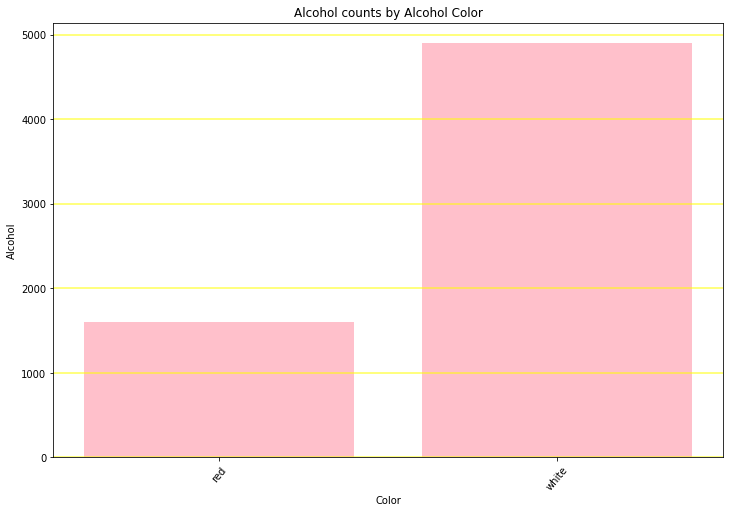

In [0]:
import matplotlib.pyplot as plt

# Get SQL Query data as Pandas dataframe
data = spark.sql("select color, count(alcohol) as alcoholCount from wines group by color order by color").toPandas()

# Clear plot 

plt.clf()

# Figure

fig = plt.figure(figsize = (12,8))

# Bar plot 

plt.bar(x = data['color'], height = data['alcoholCount'], color = 'pink')

# Customize chart

plt.title('Alcohol counts by Alcohol Color')
plt.xlabel('Color')
plt.ylabel('Alcohol')
plt.grid(color = 'yellow', linestyle = '-', linewidth = 2, axis = 'y', alpha = 0.5)
plt.xticks(rotation = 50)

plt.show()


# Analyze, Filter, Manipulate Retail sales orders (products data) 

**Libraries used** : Pyspark, spark, hive, sql, matlib, seaborn

 > * Find products that are highest selling 
 > * Which products were people's favourite last year and this year 
 > * What is the overall orders gross revenue 
 > * Check Yearly Gross Revenue per order

# Ingest Data

In [0]:
%sh

rm -r /dbfs/data
mkdir /dbfs/data

wget -O /dbfs/data/2019.csv https://raw.githubusercontent.com/MicrosoftLearning/dp-203-azure-data-engineer/master/Allfiles/labs/24/data/2019.csv

wget -O /dbfs/data/2020.csv https://raw.githubusercontent.com/MicrosoftLearning/dp-203-azure-data-engineer/master/Allfiles/labs/24/data/2020.csv

wget -O /dbfs/data/2021.csv https://raw.githubusercontent.com/MicrosoftLearning/dp-203-azure-data-engineer/master/Allfiles/labs/24/data/2021.csv

--2023-08-06 16:22:55--  https://raw.githubusercontent.com/MicrosoftLearning/dp-203-azure-data-engineer/master/Allfiles/labs/24/data/2019.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 122681 (120K) [text/plain]
Saving to: ‘/dbfs/data/2019.csv’

     0K .......... .......... .......... .......... .......... 41% 11.6M 0s
    50K .......... .......... .......... .......... .......... 83% 22.3M 0s
   100K .......... .........                                  100% 13.3M=0.008s

2023-08-06 16:22:55 (14.9 MB/s) - ‘/dbfs/data/2019.csv’ saved [122681/122681]

--2023-08-06 16:22:55--  https://raw.githubusercontent.com/MicrosoftLearning/dp-203-azure-data-engineer/master/Allfiles/labs/24/data/2020.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)

# Query data in files

In [0]:
df = spark.read.load('data/*.csv',format = 'csv')
display(df.limit(100))

_c0,_c1,_c2,_c3,_c4,_c5,_c6,_c7,_c8
SO49171,1,2021-01-01,Mariah Foster,mariah21@adventure-works.com,"Road-250 Black, 48",1,2181.5625,174.525
SO49172,1,2021-01-01,Brian Howard,brian23@adventure-works.com,"Road-250 Red, 44",1,2443.35,195.468
SO49173,1,2021-01-01,Linda Alvarez,linda19@adventure-works.com,"Mountain-200 Silver, 38",1,2071.4196,165.7136
SO49174,1,2021-01-01,Gina Hernandez,gina4@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4196,165.7136
SO49178,1,2021-01-01,Beth Ruiz,beth4@adventure-works.com,"Road-550-W Yellow, 44",1,1000.4375,80.035
SO49179,1,2021-01-01,Evan Ward,evan13@adventure-works.com,"Road-550-W Yellow, 38",1,1000.4375,80.035
SO49175,1,2021-01-01,Margaret Guo,margaret24@adventure-works.com,"Road-250 Red, 52",1,2443.35,195.468
SO49180,1,2021-01-01,Mitchell Yuan,mitchell6@adventure-works.com,"Road-650 Black, 58",1,782.99,62.6392
SO49176,1,2021-01-01,Shawn Sharma,shawn11@adventure-works.com,"Mountain-200 Silver, 46",1,2071.4196,165.7136
SO49177,1,2021-01-01,Barbara Chande,barbara44@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4196,165.7136


In [0]:
% md

Define schema for sales order data

In [0]:
from pyspark.sql.types import *
from pyspark.sql.functions import *

orderSchema = StructType([
    StructField("SalesOrderNumber",StringType()),StructField("SalesOrderLineNumber",IntegerType()),
    StructField("OrderDate",DateType()), StructField("CustomerName",StringType()),StructField("Email",StringType()),StructField("Item",StringType()),StructField("Quantity",IntegerType()),StructField("Price",FloatType()),StructField("Tax",FloatType())
])

df = spark.read.load('/data/*.csv',format = 'csv', schema = orderSchema)

display(df.limit(100))

SalesOrderNumber,SalesOrderLineNumber,OrderDate,CustomerName,Email,Item,Quantity,Price,Tax
SO49171,1,2021-01-01,Mariah Foster,mariah21@adventure-works.com,"Road-250 Black, 48",1,2181.5625,174.525
SO49172,1,2021-01-01,Brian Howard,brian23@adventure-works.com,"Road-250 Red, 44",1,2443.35,195.468
SO49173,1,2021-01-01,Linda Alvarez,linda19@adventure-works.com,"Mountain-200 Silver, 38",1,2071.4197,165.7136
SO49174,1,2021-01-01,Gina Hernandez,gina4@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4197,165.7136
SO49178,1,2021-01-01,Beth Ruiz,beth4@adventure-works.com,"Road-550-W Yellow, 44",1,1000.4375,80.035
SO49179,1,2021-01-01,Evan Ward,evan13@adventure-works.com,"Road-550-W Yellow, 38",1,1000.4375,80.035
SO49175,1,2021-01-01,Margaret Guo,margaret24@adventure-works.com,"Road-250 Red, 52",1,2443.35,195.468
SO49180,1,2021-01-01,Mitchell Yuan,mitchell6@adventure-works.com,"Road-650 Black, 58",1,782.99,62.6392
SO49176,1,2021-01-01,Shawn Sharma,shawn11@adventure-works.com,"Mountain-200 Silver, 46",1,2071.4197,165.7136
SO49177,1,2021-01-01,Barbara Chande,barbara44@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4197,165.7136


In [0]:
df.printSchema()

root
 |-- SalesOrderNumber: string (nullable = true)
 |-- SalesOrderLineNumber: integer (nullable = true)
 |-- OrderDate: date (nullable = true)
 |-- CustomerName: string (nullable = true)
 |-- Email: string (nullable = true)
 |-- Item: string (nullable = true)
 |-- Quantity: integer (nullable = true)
 |-- Price: float (nullable = true)
 |-- Tax: float (nullable = true)



# Analyze dataframe

Manipulate, Filter, Group & Analysis

In [0]:
# Filter DataFrame

customers = df['CustomerName','Email']

print("Total Order Records ", customers.count())
print("Total Distinct Customers ", customers.distinct().count())

display(customers.distinct())

Total Order Records  32718
Total Distinct Customers  12427


CustomerName,Email
Bridget Andersen,bridget15@adventure-works.com
Mya Butler,mya14@adventure-works.com
Deanna Hernandez,deanna29@adventure-works.com
Ricky Navarro,ricky10@adventure-works.com
Omar Ye,omar9@adventure-works.com
Kellie Gutierrez,kellie9@adventure-works.com
Raymond Rana,raymond13@adventure-works.com
Derrick Moreno,derrick6@adventure-works.com
Megan Walker,megan25@adventure-works.com
Edward Jackson,edward34@adventure-works.com


In [0]:
# Alternative Querying Approach using select method

customers = df.select("CustomerName","Email")

display(customers)

CustomerName,Email
Mariah Foster,mariah21@adventure-works.com
Brian Howard,brian23@adventure-works.com
Linda Alvarez,linda19@adventure-works.com
Gina Hernandez,gina4@adventure-works.com
Beth Ruiz,beth4@adventure-works.com
Evan Ward,evan13@adventure-works.com
Margaret Guo,margaret24@adventure-works.com
Mitchell Yuan,mitchell6@adventure-works.com
Shawn Sharma,shawn11@adventure-works.com
Barbara Chande,barbara44@adventure-works.com


In [0]:
# Filter with a condition

customers = df.select("CustomerName","Email").where(df['Item'] == 'Road-250 Red, 44')

print(customers.count())
print(customers.distinct().count())

display(customers.distinct())

144
144


CustomerName,Email
Kellie Gutierrez,kellie9@adventure-works.com
Ronnie Yang,ronnie4@adventure-works.com
Valerie Zhou,valerie10@adventure-works.com
Shane Sanchez,shane23@adventure-works.com
Paige Hughes,paige10@adventure-works.com
Kelli Liu,kelli4@adventure-works.com
Ashlee Luo,ashlee13@adventure-works.com
Randall Romero,randall10@adventure-works.com
Regina Perez,regina20@adventure-works.com
Jaime Mu�oz,jaime8@adventure-works.com


# Aggregate and group data in a dataframe

In [0]:
# Product Sales 

Sales = df.select("Item","Quantity").groupby("Item").sum()

display(Sales)

Item,sum(Quantity)
"Mountain-200 Black, 42",388
"Touring-1000 Yellow, 46",74
"Touring-1000 Blue, 54",67
"Short-Sleeve Classic Jersey, S",216
"Women's Mountain Shorts, S",146
"Long-Sleeve Logo Jersey, L",234
"Mountain-400-W Silver, 42",59
"Racing Socks, M",165
"Mountain-200 Silver, 42",359
"Road-750 Black, 58",170


In [0]:
# Number of sales orders per year

YearlySales = df.select(year ("OrderDate").alias("Year")).groupBy("Year").count().orderBy("Year")

display(YearlySales)

Year,count
2019,1201
2020,2733
2021,28784


# Data querying using Spark SQL

In [0]:
df.createOrReplaceTempView("salesorders")

spark_df = spark.sql("Select * from salesorders")

display(spark_df)

SalesOrderNumber,SalesOrderLineNumber,OrderDate,CustomerName,Email,Item,Quantity,Price,Tax
SO49171,1,2021-01-01,Mariah Foster,mariah21@adventure-works.com,"Road-250 Black, 48",1,2181.5625,174.525
SO49172,1,2021-01-01,Brian Howard,brian23@adventure-works.com,"Road-250 Red, 44",1,2443.35,195.468
SO49173,1,2021-01-01,Linda Alvarez,linda19@adventure-works.com,"Mountain-200 Silver, 38",1,2071.4197,165.7136
SO49174,1,2021-01-01,Gina Hernandez,gina4@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4197,165.7136
SO49178,1,2021-01-01,Beth Ruiz,beth4@adventure-works.com,"Road-550-W Yellow, 44",1,1000.4375,80.035
SO49179,1,2021-01-01,Evan Ward,evan13@adventure-works.com,"Road-550-W Yellow, 38",1,1000.4375,80.035
SO49175,1,2021-01-01,Margaret Guo,margaret24@adventure-works.com,"Road-250 Red, 52",1,2443.35,195.468
SO49180,1,2021-01-01,Mitchell Yuan,mitchell6@adventure-works.com,"Road-650 Black, 58",1,782.99,62.6392
SO49176,1,2021-01-01,Shawn Sharma,shawn11@adventure-works.com,"Mountain-200 Silver, 46",1,2071.4197,165.7136
SO49177,1,2021-01-01,Barbara Chande,barbara44@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4197,165.7136


In [0]:
%sql

select year(OrderDate) as orderyear,sum((Price*Quantity) + Tax) as GrossRevenue from salesorders group by orderyear order by orderyear;


orderyear,GrossRevenue
2019,4172169.969970703
2020,6882259.268127441
2021,1.1547835291696548E7


# Visualize data with Spark

In [0]:
%sql 

select * from salesorders;

SalesOrderNumber,SalesOrderLineNumber,OrderDate,CustomerName,Email,Item,Quantity,Price,Tax
SO49171,1,2021-01-01,Mariah Foster,mariah21@adventure-works.com,"Road-250 Black, 48",1,2181.5625,174.525
SO49172,1,2021-01-01,Brian Howard,brian23@adventure-works.com,"Road-250 Red, 44",1,2443.35,195.468
SO49173,1,2021-01-01,Linda Alvarez,linda19@adventure-works.com,"Mountain-200 Silver, 38",1,2071.4197,165.7136
SO49174,1,2021-01-01,Gina Hernandez,gina4@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4197,165.7136
SO49178,1,2021-01-01,Beth Ruiz,beth4@adventure-works.com,"Road-550-W Yellow, 44",1,1000.4375,80.035
SO49179,1,2021-01-01,Evan Ward,evan13@adventure-works.com,"Road-550-W Yellow, 38",1,1000.4375,80.035
SO49175,1,2021-01-01,Margaret Guo,margaret24@adventure-works.com,"Road-250 Red, 52",1,2443.35,195.468
SO49180,1,2021-01-01,Mitchell Yuan,mitchell6@adventure-works.com,"Road-650 Black, 58",1,782.99,62.6392
SO49176,1,2021-01-01,Shawn Sharma,shawn11@adventure-works.com,"Mountain-200 Silver, 46",1,2071.4197,165.7136
SO49177,1,2021-01-01,Barbara Chande,barbara44@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4197,165.7136


In [0]:
query1 = "select cast(YEAR (OrderDate) as char(4)) as OrderYear, sum((Price * Quantity)+ Tax) as GrossRevenue from salesorders group by OrderYear order by OrderYear"

df_spark = spark.sql(query1)
df_spark.show()

+---------+--------------------+
|OrderYear|        GrossRevenue|
+---------+--------------------+
|     2019|   4172169.969970703|
|     2020|   6882259.268127441|
|     2021|1.1547835291696548E7|
+---------+--------------------+



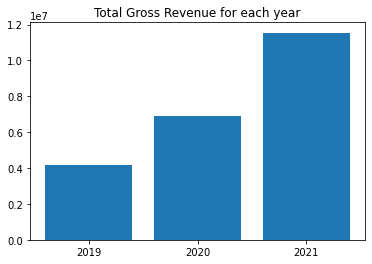

In [0]:
import matplotlib.pyplot as plt 

#matlib loads pandas df
df_sales  = df_spark.toPandas()

plt.bar(x = df_sales['OrderYear'], height= df_sales['GrossRevenue'])

plt.title('Total Gross Revenue for each year')

plt.show()



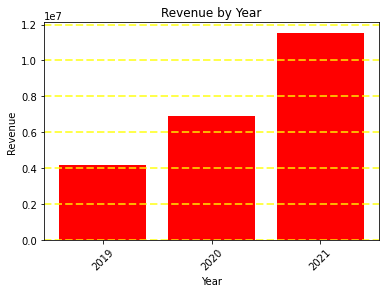

In [0]:
# Clear the plot area

plt.clf()

# Bar plot 
# Yearly Revenue
plt.bar(x = df_sales['OrderYear'], height = df_sales['GrossRevenue'], color = 'red')

#Customize chart
plt.title('Revenue by Year')
plt.xlabel('Year')
plt.ylabel('Revenue')
plt.grid(color = 'yellow', linestyle = '--', linewidth = 2, axis = 'y', alpha = 0.7)
plt.xticks(rotation = 45)

plt.show()

<Figure size 432x288 with 0 Axes>

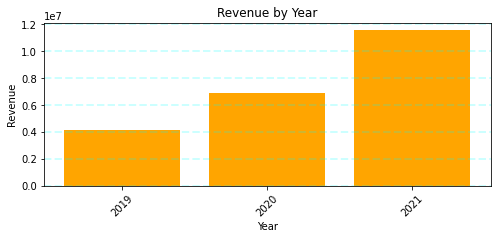

In [0]:
# Explicitly plot the figure

plt.clf()

fig  = plt.figure(figsize = (8,3))

plt.bar( x = df_sales['OrderYear'], height = df_sales['GrossRevenue'],color = 'orange')

plt.title('Revenue by Year')
plt.xlabel('Year')
plt.ylabel('Revenue')
plt.grid(color = 'aqua', linestyle = 'dashed', linewidth = 2, axis = 'y', alpha = 0.2)
plt.xticks(rotation = 45)
plt.show()

<Figure size 432x288 with 0 Axes>

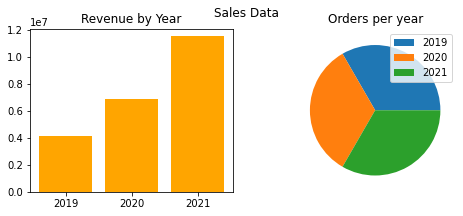

In [0]:
# Multiple Figure Subplots

# Explicitly plot the figure

plt.clf()

# 1 row , 2 columns , 2 subplots
fig, ax  = plt.subplots(1, 2, figsize = (8,3))

#Figure 1
ax[0].bar( x = df_sales['OrderYear'], height = df_sales['GrossRevenue'],color = 'orange')

ax[0].set_title('Revenue by Year')

#Figure 2
yearly_counts = df_sales['OrderYear'].value_counts()
ax[1].pie(yearly_counts)
ax[1].set_title('Orders per year')
ax[1].legend(yearly_counts.keys().tolist())

fig.suptitle('Sales Data')

plt.show()


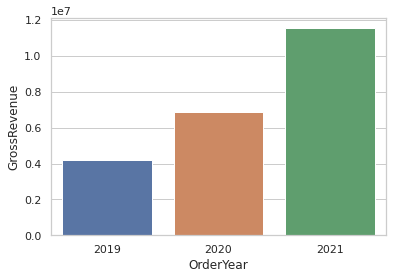

In [0]:
plt.clf()

# Barplot using seaborn 

import seaborn as sns

sns.set_theme(style = "whitegrid")

ax = sns.barplot(x = "OrderYear", y = "GrossRevenue", data = df_sales)

plt.show() 

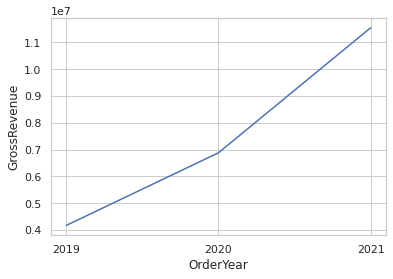

In [0]:
plt.clf()

#Line Chart using matlib and seaborn

ax = sns.lineplot(x = "OrderYear", y = "GrossRevenue", data = df_sales)

plt.show()
